# Netherlands Football League 

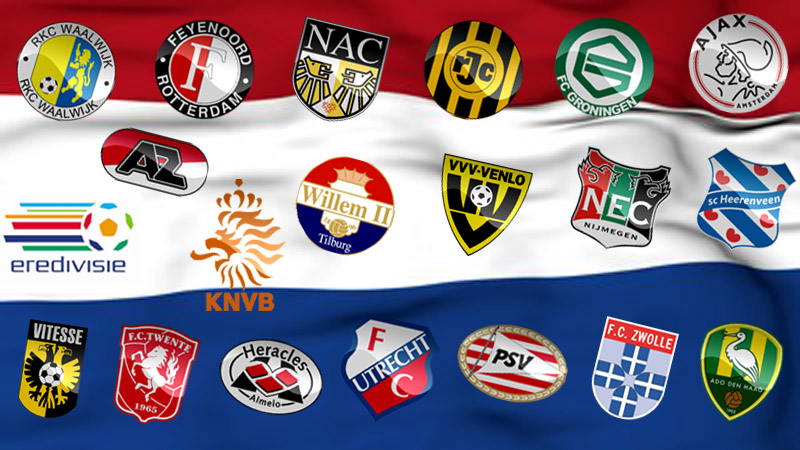

# Importing Libraries

In [1]:
#!pip install altair
import altair as alt
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

## Reading the datasets

In [2]:
Case1=pd.read_csv("LisOFPlayers18-19.csv")
new_df=pd.read_csv("EventsUpdated.csv")
new_df['game_id']=new_df['game_id'].astype(int)
UP = pd.merge(Case1, new_df,  how='left', left_on=['player_id','GameID'], right_on = ['player_id','game_id'])
ok=UP.groupby('team')['away_team_name'].apply(lambda x: x.value_counts().index[0]).reset_index() #getting team name
ok.columns=['team','Team Name'] 
UP = pd.merge(UP, ok,  how='left', left_on=['team'], right_on = ['team'])

C:\Users\Grace\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3146: DtypeWarning: Columns (27,79,99,111,120,131,252) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [3]:
Case1=pd.read_csv("LisOFPlayers17-18.csv")
new_df=pd.read_csv("EventsUpdated1718.csv")
new_df['game_id']=new_df['game_id'].astype(int)
UP1 = pd.merge(Case1, new_df,  how='left', left_on=['player_id','GameID'], right_on = ['player_id','game_id'])
ok=UP1.groupby('team')['away_team_name'].apply(lambda x: x.value_counts().index[0]).reset_index() #getting team name
ok.columns=['team','Team Name'] 
UP1 = pd.merge(UP1, ok,  how='left', left_on=['team'], right_on = ['team'])

C:\Users\Grace\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3146: DtypeWarning: Columns (86,116,164,203) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [4]:
UP=pd.concat([UP,UP1])

In [5]:
pd.set_option('display.max_columns', None) 

In [6]:
UP=UP[UP['position']!='Goalkeeper']
UP=UP[UP['6']!=1] # drop corner
UP=UP[UP['2']!=1] # assist
UP=UP[UP['5']!=1] #free kick
UP=UP[UP['107']!=1] # trow
UP=UP[UP['279']!=1] # kickof
UP = UP[UP['x'].notna()]
UP=UP.dropna(axis=1)

## To Make Clusetrs

In [7]:
tocluster=UP[['outcome','x','y']]

In [8]:
tocluster

,outcome,x,y
70,1.0,0.000,0.000
72,1.0,44.415,11.084
73,1.0,36.960,5.780
74,1.0,23.520,-0.408
75,0.0,17.535,4.216
...,...,...,...
528664,1.0,72.345,7.480
528665,1.0,75.600,20.196
528666,1.0,97.125,31.280
528667,1.0,72.450,25.568


In [9]:
RemainingCols = UP.drop(['outcome','x','y'],axis=1)

In [10]:
scaler = StandardScaler()
scaled_features = scaler.fit_transform(tocluster)

In [11]:
distortions = []
K = range(1,10)
for k in K:
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(scaled_features)
    distortions.append(kmeanModel.inertia_)

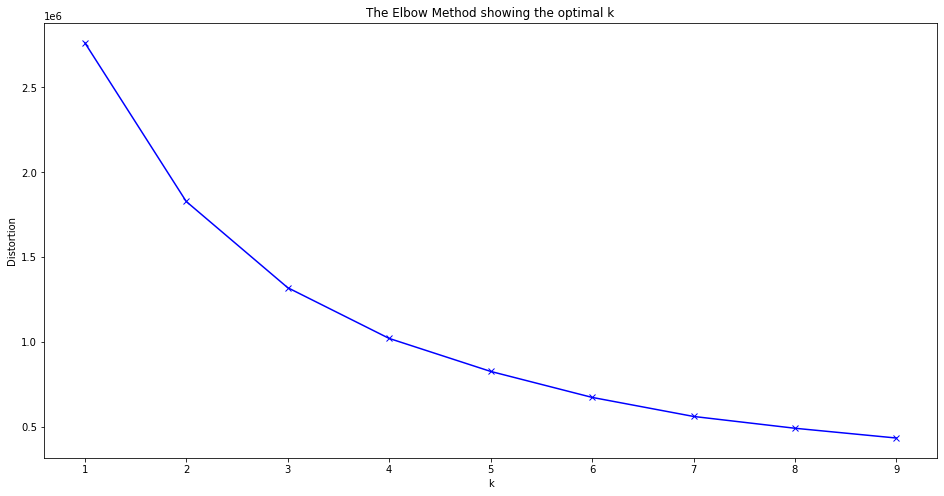

In [12]:
plt.figure(figsize=(16,8))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

In [13]:
kmeans = KMeans(n_clusters=7)

In [14]:
kmeans.fit(scaled_features)

KMeans(n_clusters=7)

In [15]:
tocluster['Clusters']=kmeans.labels_

<ipython-input-15-6a09706fd6aa>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tocluster['Clusters']=kmeans.labels_


In [16]:
Combined=pd.concat([RemainingCols,tocluster],axis=1)

In [17]:
np.sort(Combined[Combined['outcome']==0]['Clusters'].unique())

array([2, 3, 4])

In [18]:
Combined[Combined['Clusters']==2][['x','y']]

,x,y
146,45.150,59.024
149,49.035,66.436
160,39.585,62.900
177,41.265,65.008
187,1.365,63.172
...,...,...
528440,69.300,59.432
528467,65.100,58.072
528506,42.105,61.404
528605,55.650,43.452


In [19]:
Combined[Combined['Clusters']==3][['x','y']]

,x,y
91,102.900,22.984
94,87.255,7.208
102,65.625,35.496
105,72.240,11.492
123,77.175,13.056
...,...,...
528588,97.650,46.784
528589,86.520,9.792
528607,86.940,17.000
528638,75.705,26.928


In [20]:
Combined[Combined['Clusters']==4][['x','y']]

,x,y
75,17.535,4.216
83,43.680,19.380
85,46.410,1.564
98,65.100,-1.224
117,38.010,7.752
...,...,...
528634,44.100,2.584
528649,75.180,3.944
528652,46.830,8.364
528653,42.630,12.376


In [21]:
Combined[Combined['Clusters']==6][['x','y']]

,x,y
70,0.000,0.000
73,36.960,5.780
74,23.520,-0.408
76,17.010,19.448
77,42.210,20.332
...,...,...
528647,0.000,0.000
528650,0.000,0.000
528651,0.000,0.000
528654,26.775,19.380


In [22]:
COUNT=pd.DataFrame(Combined.groupby(["Clusters"]).count()['outcome'])
COUNT=COUNT.sort_values("outcome",ascending=False)

# Expected Goals Assignments based on Clusters

## Cluster having highest number of passes have highest chance to particepate to make a goal

In [23]:
def ggf(row):
    if row['Clusters'] == COUNT.index[0]:
        val = 90
    elif row['Clusters'] ==COUNT.index[1]:
        val = 88
    elif row['Clusters'] ==COUNT.index[2]:
        val =86
    elif row['Clusters'] ==COUNT.index[3]:
        val = 84
    else:
        val = 0
    return val

In [24]:
Combined['Value_Individual_Pass'] = Combined.apply(ggf, axis=1)

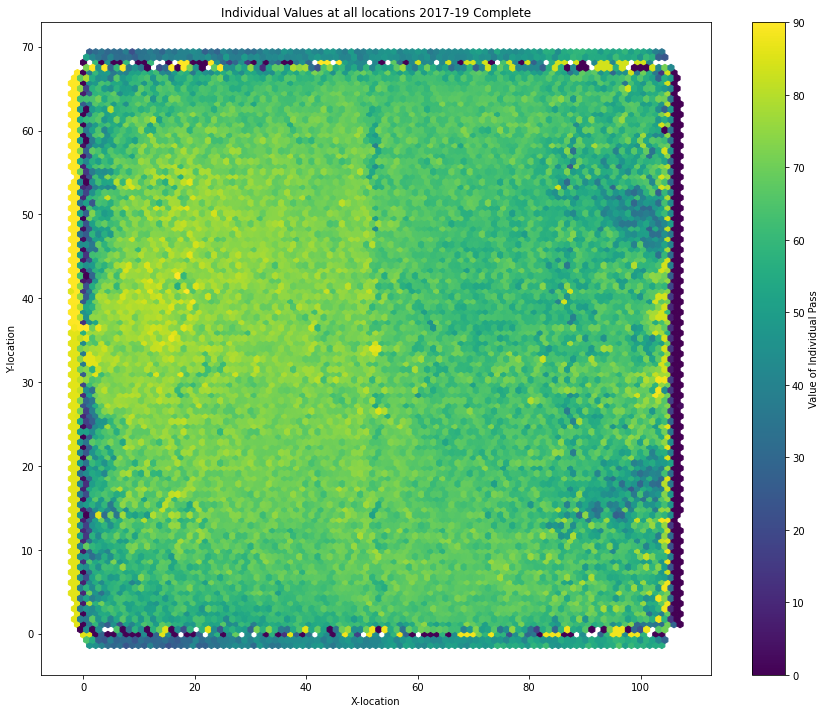

In [25]:
from matplotlib import pyplot as plt 
from matplotlib import cm as CM
from matplotlib import mlab as ml
import numpy as np 

#data = np.loadtxt('inputfile', unpack=True, dtype='str, int, int, int, int, float')

x = Combined['x']
y = Combined['y']
z = Combined['Value_Individual_Pass']

# These lines are completely unnecessary and perhaps come
# from a different solution which was interpolating between points
#X, Y = np.meshgrid(x,y)
#x = X.ravel()
#y = Y.ravel()

gridsize = 30 
#plt.subplot(111)  # <- You don't need this as it is one plot anyway
plt.hexbin(x, y, C=z)   # <- You need to do the hexbin plot
cb = plt.colorbar()
cb.set_label('Value of Individual Pass')
plt.gcf().set_size_inches(15, 12)
plt.xlabel("X-location")
plt.ylabel("Y-location")
plt.title("Individual Values at all locations 2017-19 Complete")
plt.show() 

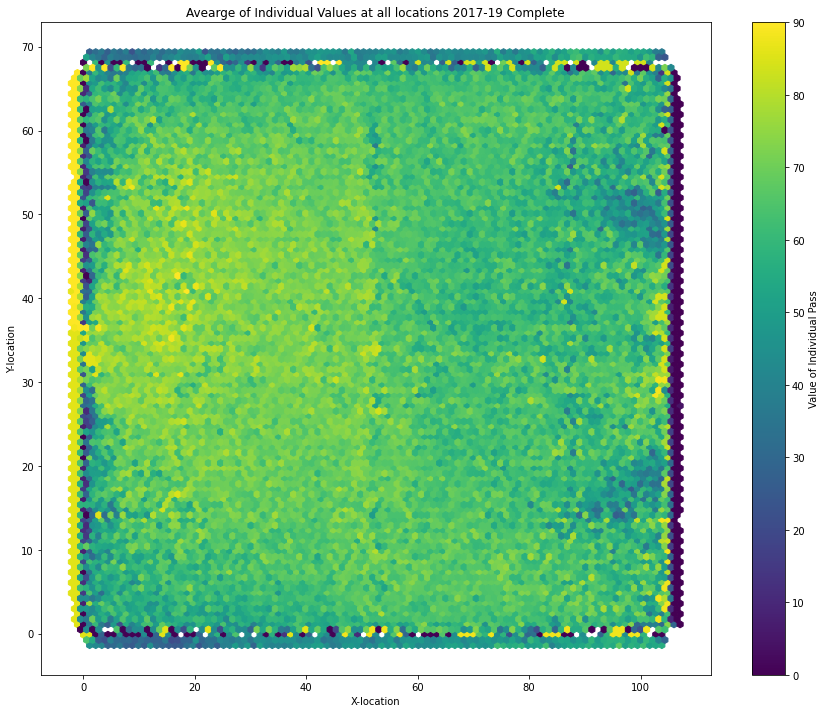

In [26]:
checkthat=Combined.groupby(['x','y'])['Value_Individual_Pass'].mean().reset_index()
x = checkthat['x']
y = checkthat['y']
z = checkthat['Value_Individual_Pass']

# These lines are completely unnecessary and perhaps come
# from a different solution which was interpolating between points
#X, Y = np.meshgrid(x,y)
#x = X.ravel()
#y = Y.ravel()

gridsize = 30 
#plt.subplot(111)  # <- You don't need this as it is one plot anyway
plt.hexbin(x, y, C=z)   # <- You need to do the hexbin plot
cb = plt.colorbar()
cb.set_label('Value of Individual Pass')
plt.gcf().set_size_inches(15, 12)
plt.xlabel("X-location")
plt.ylabel("Y-location")
plt.title("Avearge of Individual Values at all locations 2017-19 Complete")
plt.show() 

In [27]:
see=Combined.sort_values("Value_Individual_Pass",ascending=False)
see=see.head(5000)
alt.Chart(see).mark_point().encode(
    x='x:Q',
    y='y:Q',
    color='Value_Individual_Pass:Q'  # <-- To Color the Pass Values and ECOM!
  ).properties(
        title='Top Locations for Individual Passes that Results in Goals season 2017-19 Complete'
    )

alt.Chart(...)

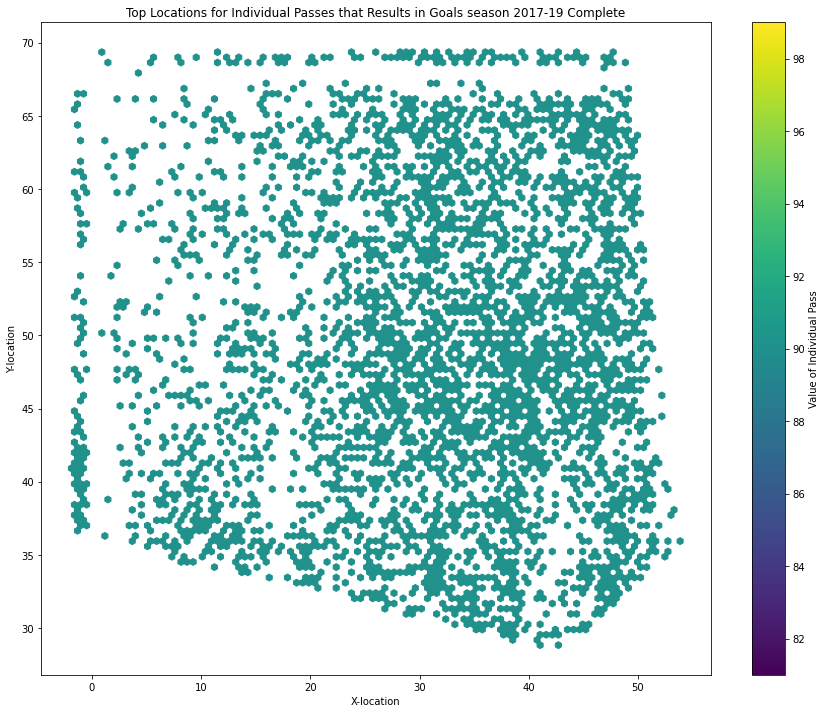

In [28]:
x = see['x']
y = see['y']
z = see['Value_Individual_Pass']

# These lines are completely unnecessary and perhaps come
# from a different solution which was interpolating between points
#X, Y = np.meshgrid(x,y)
#x = X.ravel()
#y = Y.ravel()

gridsize = 30 
#plt.subplot(111)  # <- You don't need this as it is one plot anyway
plt.hexbin(x, y, C=z)   # <- You need to do the hexbin plot
cb = plt.colorbar()
cb.set_label('Value of Individual Pass')
plt.gcf().set_size_inches(15, 12)
plt.xlabel("X-location")
plt.ylabel("Y-location")
plt.title("Top Locations for Individual Passes that Results in Goals season 2017-19 Complete")
plt.show() 

In [29]:
see=Combined.sort_values("Value_Individual_Pass",ascending=False)
see=see.tail(5000)
alt.Chart(see).mark_point().encode(
    x='x:Q',
    y='y:Q',
    color='Value_Individual_Pass:Q'  # <-- To Color the Pass Values and ECOM!
  ).properties(
        title='Location of the passes that do not Results in Goals season 2017-19 Complete'
    )

alt.Chart(...)

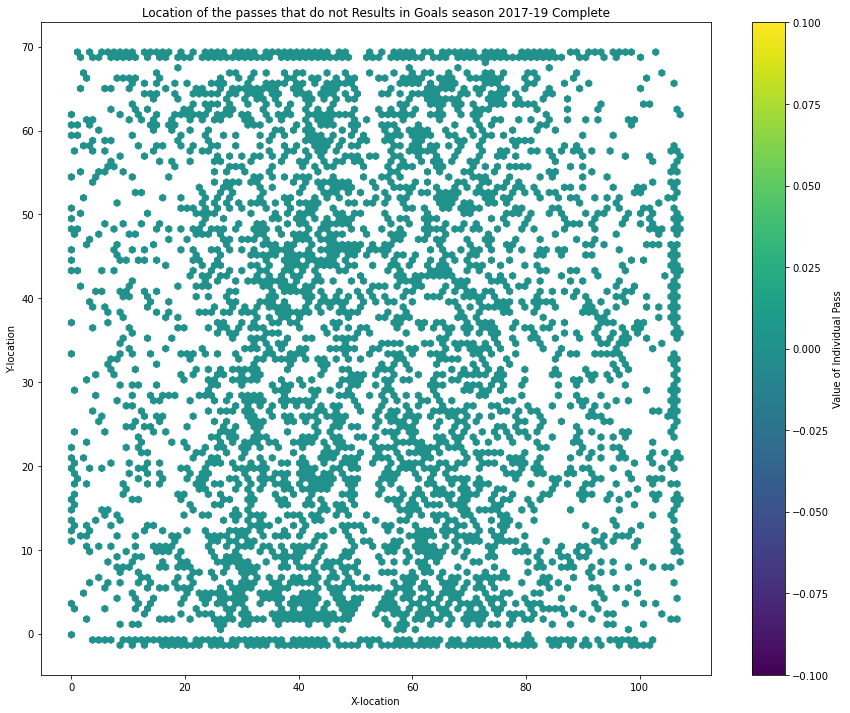

In [30]:
x = see['x']
y = see['y']
z = see['Value_Individual_Pass']

# These lines are completely unnecessary and perhaps come
# from a different solution which was interpolating between points
#X, Y = np.meshgrid(x,y)
#x = X.ravel()
#y = Y.ravel()

gridsize = 30 
#plt.subplot(111)  # <- You don't need this as it is one plot anyway
plt.hexbin(x, y, C=z)   # <- You need to do the hexbin plot
cb = plt.colorbar()
cb.set_label('Value of Individual Pass')
plt.gcf().set_size_inches(15, 12)
plt.xlabel("X-location")
plt.ylabel("Y-location")
plt.title("Location of the passes that do not Results in Goals season 2017-19 Complete")
plt.show() 

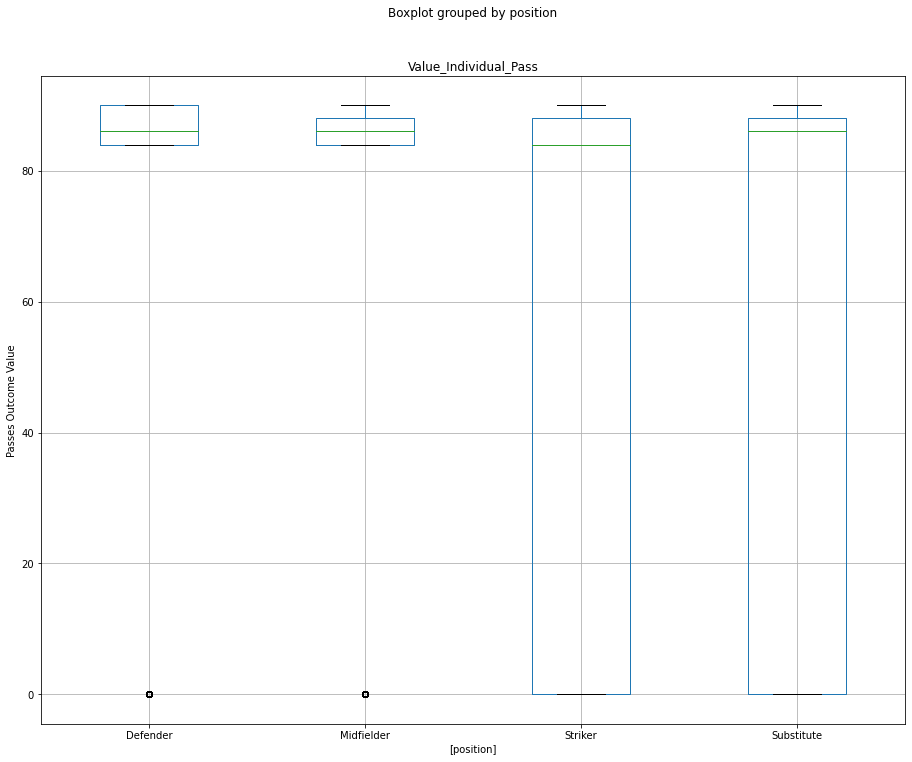

In [31]:
to_plot=Combined[['position','Value_Individual_Pass']]
to_plot.boxplot(by='position')
plt.gcf().set_size_inches(15, 12)
plt.ylabel("Passes Outcome Value")
plt.show() 

## To Rank players Calculation of ECOM

In [32]:
# Number Of Minutes Played
MIN_PLAYED=pd.DataFrame(Combined.groupby('player_name')['mins_played'].sum())

In [33]:
MIN_PLAYED['SUMM']=Combined.groupby('player_name')['Value_Individual_Pass'].sum()

In [34]:
MIN_PLAYED['ECOM']=(MIN_PLAYED['SUMM']/MIN_PLAYED['mins_played'])*90

In [35]:
MIN_PLAYED['x']=Combined.groupby("player_name")['x'].mean()
MIN_PLAYED['y']=Combined.groupby("player_name")['y'].mean()

alt.Chart(MIN_PLAYED).mark_point().encode(
    x='x:Q',
    y='y:Q',
    color='ECOM:Q'  # <-- To Color the Pass Values and ECOM!
  ).properties(
        title='Locations showing ECOM for all events including rare events season 2017-19 Complete'
    )

alt.Chart(...)

In [36]:
MIN_PLAYED['NUMBER OF EVENTS']=Combined.groupby('player_name')['event_id'].count()

# To Rank players based on ECOM

In [37]:
MIN_PLAYED['percent_mark_80'] = np.where(MIN_PLAYED['NUMBER OF EVENTS'] > np.percentile(MIN_PLAYED['NUMBER OF EVENTS'], 80), 1, 0)
to_rank=MIN_PLAYED[MIN_PLAYED['percent_mark_80']==1]
to_rank.sort_values(["ECOM"],ascending=False).head(5)

,mins_played,SUMM,ECOM,x,y,NUMBER OF EVENTS,percent_mark_80
player_name,,,,,,,
Frenkie de Jong,489109.333333,430126,79.146598,51.478336,40.113417,5599,1
Lasse Schöne,435359.716667,380728,78.706225,51.882991,31.776094,5286,1
Stijn Wuytens,262936.850000,226082,77.385045,34.700653,44.979769,2956,1
Urby Emanuelson,261796.150000,221122,76.017084,50.103203,43.783252,3288,1
Ron Vlaar,275100.883333,231378,75.695940,35.000613,27.485296,3084,1


In [38]:
to_rank.sort_values(["ECOM"],ascending=False).head(5).index

Index(['Frenkie de Jong', 'Lasse Schöne', 'Stijn Wuytens', 'Urby Emanuelson',
       'Ron Vlaar'],
      dtype='object', name='player_name')

In [39]:
to_rank=to_rank.reset_index()
alt.Chart(to_rank).mark_bar().encode(
    x='ECOM',
    y=alt.Y('player_name', sort={"encoding": "x", "order": "descending"})
).properties(
    title='Top players for passes considering overall matches'
)

alt.Chart(...)

In [40]:
alt.Chart(to_rank).mark_point().encode(
    x='x:Q',
    y='y:Q',
    color='ECOM:Q'  # <-- To Color the Pass Values and ECOM!
  ).properties(
        title='Locations showing ECOM for all events excluding rare events season 2017-19 Complete'
    )

alt.Chart(...)

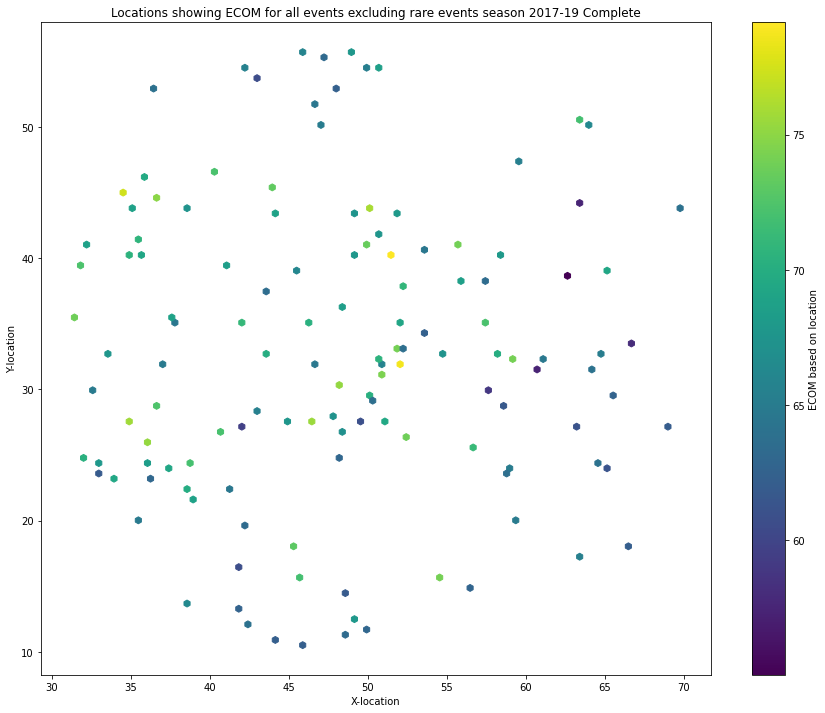

In [41]:
x = to_rank['x']
y = to_rank['y']
z = to_rank['ECOM']

# These lines are completely unnecessary and perhaps come
# from a different solution which was interpolating between points
#X, Y = np.meshgrid(x,y)
#x = X.ravel()
#y = Y.ravel()

gridsize = 30 
#plt.subplot(111)  # <- You don't need this as it is one plot anyway
plt.hexbin(x, y, C=z)   # <- You need to do the hexbin plot
cb = plt.colorbar()
cb.set_label('ECOM based on location')
plt.gcf().set_size_inches(15, 12)
plt.xlabel("X-location")
plt.ylabel("Y-location")
plt.title("Locations showing ECOM for all events excluding rare events season 2017-19 Complete")
plt.show() 

## To Rank Player for Each Position

In [42]:
MIN_PLAYED=pd.DataFrame(Combined.groupby(['player_name','position'])['mins_played'].sum())

In [43]:
MIN_PLAYED['SUMM']=Combined.groupby(['player_name','position'])['Value_Individual_Pass'].sum()

In [44]:
MIN_PLAYED['x']=Combined.groupby(['player_name','position'])['x'].mean()
MIN_PLAYED['y']=Combined.groupby(['player_name','position'])['y'].mean()

In [45]:
MIN_PLAYED['ECOM']=(MIN_PLAYED['SUMM']/MIN_PLAYED['mins_played'])*90

In [46]:
MIN_PLAYED['NUMBER OF EVENTS']=Combined.groupby(['player_name','position'])['event_id'].count()

# Defenders

In [47]:
MIN_PLAYED['percent_mark_80'] = np.where(MIN_PLAYED['NUMBER OF EVENTS'] > np.percentile(MIN_PLAYED['NUMBER OF EVENTS'], 80), 1, 0)
to_rank=MIN_PLAYED[MIN_PLAYED['percent_mark_80']==1]
to_rank.sort_values(["ECOM"],ascending=False).head(5)
to_rank=to_rank.reset_index()
Defender=to_rank[to_rank['position']=='Defender']
Defender.sort_values(["ECOM"],ascending=False).head(5)

,player_name,position,mins_played,SUMM,x,y,ECOM,NUMBER OF EVENTS,percent_mark_80
153,Maximilian Wöber,Defender,123836.166667,115440,42.520995,47.346589,83.897946,1573,1
222,Stijn Wuytens,Defender,262107.133333,222036,34.836788,45.182301,76.240733,2895,1
65,Frenkie de Jong,Defender,150510.000000,127444,44.305625,42.434368,76.207295,1608,1
202,Ron Vlaar,Defender,272791.016667,227734,34.978723,27.600908,75.134659,3030,1
86,Jan-Arie van der Heijden,Defender,310226.116667,258082,36.508538,44.637661,74.872420,3354,1


In [48]:
list(Defender.sort_values(["ECOM"],ascending=False).head(5)['player_name'])

['Maximilian Wöber',
 'Stijn Wuytens',
 'Frenkie de Jong',
 'Ron Vlaar',
 'Jan-Arie van der Heijden']

In [49]:
#to_rank=to_rank.reset_index()
alt.Chart(Defender).mark_bar().encode(
    x='ECOM',
    y=alt.Y('player_name', sort={"encoding": "x", "order": "descending"})
).properties(
    title='Top Defenders '
)

alt.Chart(...)

In [50]:
alt.Chart(Defender).mark_point().encode(
    x='x:Q',
    y='y:Q',
    color='ECOM:Q'  # <-- To Color the Pass Values and ECOM!
  ).properties(
        title='Locations showing ECOM for Defenders season 2017-19 Complete'
    )

alt.Chart(...)

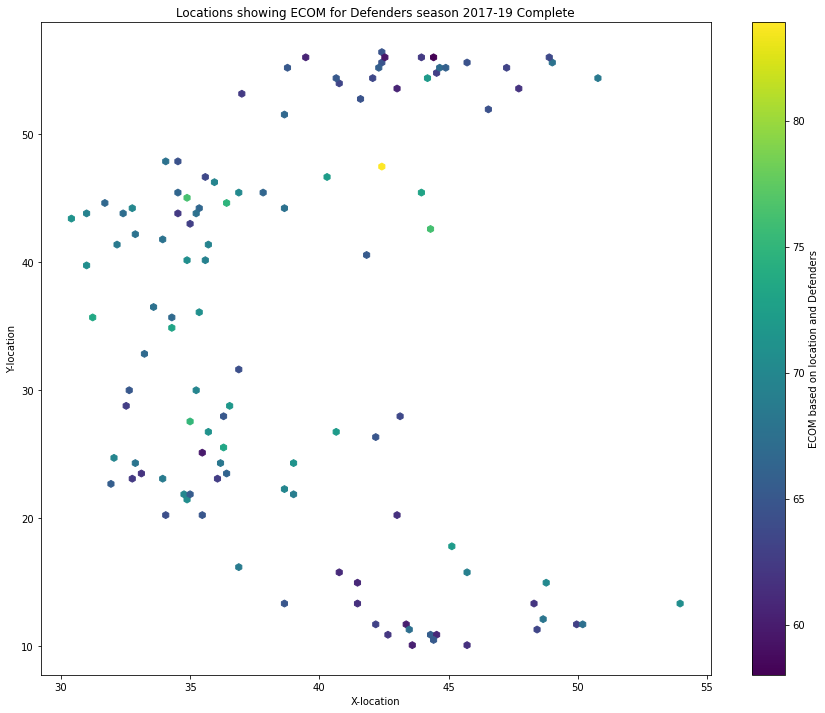

In [51]:
x = Defender['x']
y = Defender['y']
z = Defender['ECOM']

# These lines are completely unnecessary and perhaps come
# from a different solution which was interpolating between points
#X, Y = np.meshgrid(x,y)
#x = X.ravel()
#y = Y.ravel()

gridsize = 30 
#plt.subplot(111)  # <- You don't need this as it is one plot anyway
plt.hexbin(x, y, C=z)   # <- You need to do the hexbin plot
cb = plt.colorbar()
cb.set_label('ECOM based on location and Defenders')
plt.gcf().set_size_inches(15, 12)
plt.xlabel("X-location")
plt.ylabel("Y-location")
plt.title("Locations showing ECOM for Defenders season 2017-19 Complete")
plt.show() 

# Strikers

In [52]:
MIN_PLAYED['percent_mark_80'] = np.where(MIN_PLAYED['NUMBER OF EVENTS'] > np.percentile(MIN_PLAYED['NUMBER OF EVENTS'], 80), 1, 0)
to_rank=MIN_PLAYED[MIN_PLAYED['percent_mark_80']==1]
to_rank.sort_values(["ECOM"],ascending=False).head(5)
to_rank=to_rank.reset_index()
Striker=to_rank[to_rank['position']=='Striker']
Striker.sort_values(["ECOM"],ascending=False).head(5)

,player_name,position,mins_played,SUMM,x,y,ECOM,NUMBER OF EVENTS,percent_mark_80
54,Erik Falkenburg,Striker,92411.733333,74600,58.410417,38.701444,72.653112,1260,1
69,Giovanni Korte,Striker,96890.183333,78016,54.905720,23.562223,72.468023,1222,1
88,Jean-Paul Boëtius,Striker,99494.516667,76532,61.036941,46.859029,69.228740,1190,1
207,Sam Larsson,Striker,246098.100000,187454,63.424518,50.822167,68.553394,2882,1
220,Steven Bergwijn,Striker,316626.966667,239424,65.308936,39.372577,68.055353,3653,1


In [53]:
list(Striker.sort_values(["ECOM"],ascending=False).head(5)['player_name'])

['Erik Falkenburg',
 'Giovanni Korte',
 'Jean-Paul Boëtius',
 'Sam Larsson',
 'Steven Bergwijn']

In [54]:
#to_rank=to_rank.reset_index()
alt.Chart(Striker).mark_bar().encode(
    x='ECOM',
    y=alt.Y('player_name', sort={"encoding": "x", "order": "descending"})
).properties(
    title='Top Striker '
)

alt.Chart(...)

In [55]:
alt.Chart(Striker).mark_point().encode(
    x='x:Q',
    y='y:Q',
    color='ECOM:Q'  # <-- To Color the Pass Values and ECOM!
  ).properties(
        title='Locations showing ECOM for Strikers season 2017-19 Complete'
    )

alt.Chart(...)

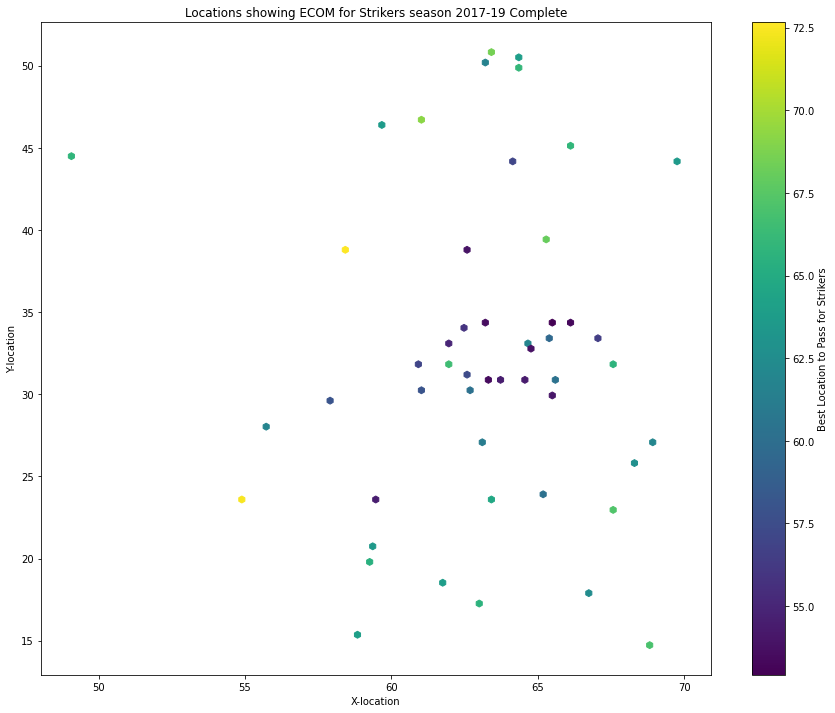

In [56]:
x = Striker['x']
y = Striker['y']
z = Striker['ECOM']

# These lines are completely unnecessary and perhaps come
# from a different solution which was interpolating between points
#X, Y = np.meshgrid(x,y)
#x = X.ravel()
#y = Y.ravel()

gridsize = 30 
#plt.subplot(111)  # <- You don't need this as it is one plot anyway
plt.hexbin(x, y, C=z)   # <- You need to do the hexbin plot
cb = plt.colorbar()
cb.set_label('Best Location to Pass for Strikers')
plt.gcf().set_size_inches(15, 12)
plt.gcf().set_size_inches(15, 12)
plt.xlabel("X-location")
plt.ylabel("Y-location")
plt.title("Locations showing ECOM for Strikers season 2017-19 Complete")
plt.show() 

# Midfielder

In [57]:
MIN_PLAYED['percent_mark_80'] = np.where(MIN_PLAYED['NUMBER OF EVENTS'] > np.percentile(MIN_PLAYED['NUMBER OF EVENTS'], 80), 1, 0)
to_rank=MIN_PLAYED[MIN_PLAYED['percent_mark_80']==1]
to_rank.sort_values(["ECOM"],ascending=False).head(5)
to_rank=to_rank.reset_index()
Midfielder=to_rank[to_rank['position']=='Midfielder']
Midfielder.sort_values(["ECOM"],ascending=False).head(5)

,player_name,position,mins_played,SUMM,x,y,ECOM,NUMBER OF EVENTS,percent_mark_80
66,Frenkie de Jong,Midfielder,328462.733333,282614,54.483784,39.169606,77.437278,3726,1
129,Lasse Schöne,Midfielder,427492.500000,363274,51.872056,31.603592,76.480079,5056,1
67,Gastón Pereiro,Midfielder,156629.716667,131304,64.119613,29.928449,75.447752,1988,1
233,Thulani Serero,Midfielder,460503.350000,384812,46.482805,27.715096,75.207010,5091,1
101,Jordy Clasie,Midfielder,249714.566667,208628,48.046819,30.304169,75.191929,2862,1


In [58]:
list(Midfielder.sort_values(["ECOM"],ascending=False).head(5)['player_name'])

['Frenkie de Jong',
 'Lasse Schöne',
 'Gastón Pereiro',
 'Thulani Serero',
 'Jordy Clasie']

In [59]:
#to_rank=to_rank.reset_index()
alt.Chart(Midfielder).mark_bar().encode(
    x='ECOM',
    y=alt.Y('player_name', sort={"encoding": "x", "order": "descending"})
).properties(
    title='Top Midfielder '
)

alt.Chart(...)

In [60]:
alt.Chart(Midfielder).mark_point().encode(
    x='x:Q',
    y='y:Q',
    color='ECOM:Q'  # <-- To Color the Pass Values and ECOM!
  ).properties(
        title='Locations showing ECOM for Midfielder season 2017-19 Complete'
    )

alt.Chart(...)

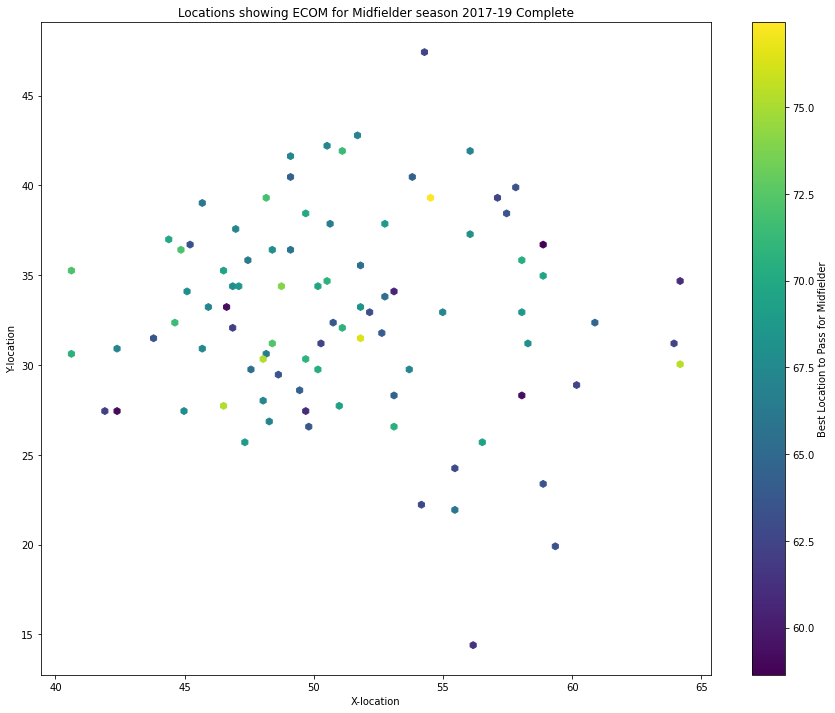

In [61]:
x = Midfielder['x']
y = Midfielder['y']
z = Midfielder['ECOM']

# These lines are completely unnecessary and perhaps come
# from a different solution which was interpolating between points
#X, Y = np.meshgrid(x,y)
#x = X.ravel()
#y = Y.ravel()

gridsize = 30 
#plt.subplot(111)  # <- You don't need this as it is one plot anyway
plt.hexbin(x, y, C=z)   # <- You need to do the hexbin plot
cb = plt.colorbar()
cb.set_label('Best Location to Pass for Midfielder')
plt.gcf().set_size_inches(15, 12)
plt.xlabel("X-location")
plt.ylabel("Y-location")
plt.title("Locations showing ECOM for Midfielder season 2017-19 Complete")
plt.show() 

# Top 5 Players with best passings In each team

In [62]:
Teams=list(Combined['Team Name'].unique())

In [63]:
MIN_PLAYED=pd.DataFrame(Combined.groupby(['player_name','Team Name'])['mins_played'].sum())

In [64]:
MIN_PLAYED['SUMM']=Combined.groupby(['player_name','Team Name'])['Value_Individual_Pass'].sum()

In [65]:
MIN_PLAYED['ECOM']=(MIN_PLAYED['SUMM']/MIN_PLAYED['mins_played'])*90

In [66]:
MIN_PLAYED['NUMBER OF EVENTS']=Combined.groupby(['player_name','Team Name'])['event_id'].count()

In [67]:
MIN_PLAYED['x']=Combined.groupby(['player_name','Team Name'])['x'].mean()
MIN_PLAYED['y']=Combined.groupby(['player_name','Team Name'])['y'].mean()

In [68]:
SET=MIN_PLAYED.reset_index()

In [69]:
i=0
while i<len(Teams):
    copy=SET[SET['Team Name']==Teams[i]]
    copy=copy.sort_values(["NUMBER OF EVENTS"],ascending=False).head(10)
    copy=copy.drop(["Team Name"],axis=1)
    print("\n Team ", Teams[i])
    #print(copy.sort_values(["ECOM"],ascending=False).head(5))
    print(list(copy.sort_values(["ECOM"],ascending=False).head(5)['player_name']))
    chart =alt.Chart(copy).mark_bar().encode(
        x='ECOM',
        y=alt.Y('player_name', sort= {"encoding": "x", "order": "descending"})
    ).properties(
        title='Season 2017-19 Complete Top 10 players for team '+str(Teams[i])
    )
    chart.display()
    i=i+1


 Team  FC Groningen
['Django Warmerdam', 'Mike te Wierik', 'Juninho Bacuna', 'Ludovit Reis', 'Samir Memisevic']


alt.Chart(...)


 Team  Fortuna Sittard
['Ahmed El Messaoudi', 'Jorrit Smeets', 'Mark Diemers', 'José Rodríguez Martínez', 'Kai Heerings']


alt.Chart(...)


 Team  Vitesse
['Thulani Serero', 'Matt Miazga', 'Jake Clarke-Salter', 'Maikel van der Werff', 'Guram Kashia']


alt.Chart(...)


 Team  De Graafschap
['Daryl van Mieghem', 'Sven Nieuwpoort', 'Jordy Tutuarima', 'Bart Straalman', 'Ted van de Pavert']


alt.Chart(...)


 Team  Heracles Almelo
['Lerin Duarte', 'Jamiro Monteiro', 'Alexander Merkel', 'Mohammed Osman', 'Dario Van den Buijs']


alt.Chart(...)


 Team  Excelsior
['Ali Messaoud', 'Hervé Matthys', 'Jerdy Schouten', 'Luigi Bruins', 'Hicham Faik']


alt.Chart(...)


 Team  Ajax
['Frenkie de Jong', 'Lasse Schöne', 'Noussair Mazraoui', 'Daley Blind', 'Matthijs de Ligt']


alt.Chart(...)


 Team  FC Utrecht
['Urby Emanuelson', 'Rico Strieder', 'Timo Letschert', 'Joris van Overeem', 'Willem Janssen']


alt.Chart(...)


 Team  PEC Zwolle
['Thomas Lam', 'Philippe Sandler', 'Rick Dekker', 'Dirk Marcellis', 'Bram van Polen']


alt.Chart(...)


 Team  VVV-Venlo
['Jerold Promes', 'Nils Röseler', 'Roel Janssen', 'Clint Leemans', 'Johnatan Opoku']


alt.Chart(...)


 Team  Willem II
['Daniel Crowley', 'Damil Dankerlui', 'Pedro Chirivella', 'Pol Llonch', 'Darryl Lachman']


alt.Chart(...)


 Team  FC Emmen
['Hilal Ben Moussa', 'Keziah Veendorp', 'Jafar Arias', 'Michael Chacón', 'Luciano Slagveer']


alt.Chart(...)


 Team  AZ
['Stijn Wuytens', 'Ron Vlaar', 'Pantelis Hatzidiakos', 'Mats Seuntjens', 'Fredrik Midtsjø']


alt.Chart(...)


 Team  PSV
['Pablo Rosario', 'Nick Viergever', 'Daniel Schwaab', 'Steven Bergwijn', 'Jorrit Hendrix']


alt.Chart(...)


 Team  Feyenoord
['Jordy Clasie', 'Jan-Arie van der Heijden', 'Jeremiah St. Juste', 'Sven van Beek', 'Eric Botteghin']


alt.Chart(...)


 Team  ADO Den Haag
['Elson Hooi', 'Wilfried Kanon', 'Tyronne Ebuehi', 'Danny Bakker', 'Abdenasser El Khayati']


alt.Chart(...)


 Team  sc Heerenveen
['Yuki Kobayashi', 'Kik Pierie', 'Morten Thorsby', 'Stijn Schaars', 'Daniel Høegh']


alt.Chart(...)


 Team  NAC Breda
['Mounir El Allouchi', 'Gianluca Nijholt', 'Karol Mets', 'Menno Koch', 'Pablo Marí Villar']


alt.Chart(...)


 Team  FC Twente
['Oussama Assaidi', 'Danny Holla', 'Stefan Thesker', 'Cristián Cuevas', 'Peet Bijen']


alt.Chart(...)


 Team  Sparta Rotterdam
['Loris Brogno', 'Deroy Duarte', 'Michel Breuer', 'Julian Chabot', 'Kenneth Dougall']


alt.Chart(...)


 Team  Roda JC Kerkrade
['Tsiy William Ndenge', 'Ognjen Gnjatic', 'Mohamed El Makrini', 'Simon Gustafson', 'Jannes Vansteenkiste']


alt.Chart(...)

In [70]:
Jong=Combined[Combined['player_name']=='Frenkie de Jong']
alt.Chart(Jong).mark_point().encode(
    x='x:Q',
    y='y:Q',
    color='Value_Individual_Pass:Q'  
  ).properties(
        title='Analysis of Outcomes for Frenkie de Jong  2017-19 Complete'
    )

MaxRowsError: The number of rows in your dataset is greater than the maximum allowed (5000). For information on how to plot larger datasets in Altair, see the documentation

alt.Chart(...)

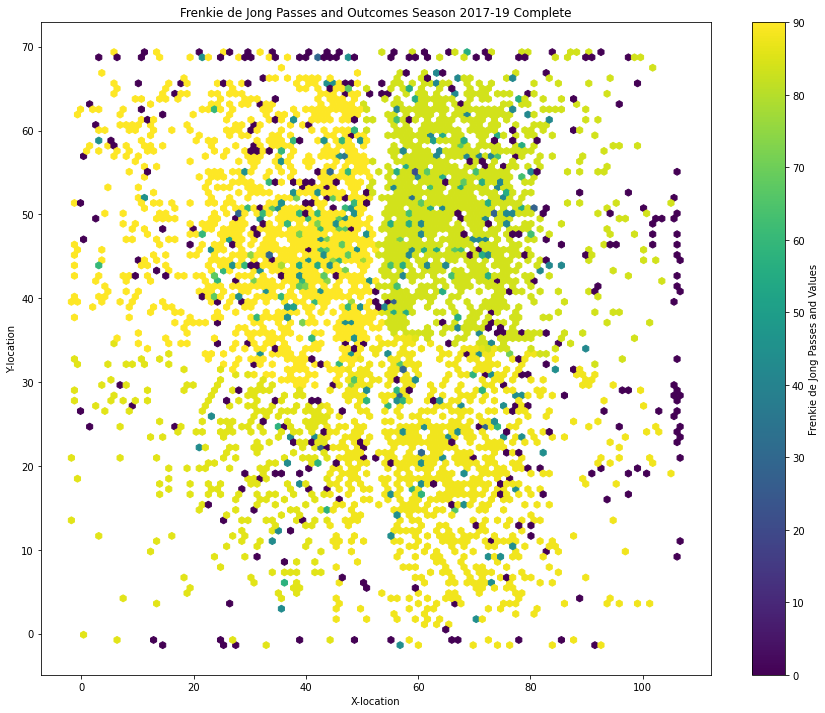

In [71]:
x = Jong['x']
y = Jong['y']
z = Jong['Value_Individual_Pass']

# These lines are completely unnecessary and perhaps come
# from a different solution which was interpolating between points
#X, Y = np.meshgrid(x,y)
#x = X.ravel()
#y = Y.ravel()

gridsize = 30 
#plt.subplot(111)  # <- You don't need this as it is one plot anyway
plt.hexbin(x, y, C=z)   # <- You need to do the hexbin plot
cb = plt.colorbar()
cb.set_label('Frenkie de Jong Passes and Values')
plt.xlabel("X-location")
plt.ylabel("Y-location")
plt.title("Frenkie de Jong Passes and Outcomes Season 2017-19 Complete")
plt.gcf().set_size_inches(15, 12)
plt.show() 

In [72]:
#Jens Toornstra
Toornstra=Combined[Combined['player_name']=='Jens Toornstra']
alt.Chart(Toornstra).mark_point().encode(
    x='x:Q',
    y='y:Q',
    color='Value_Individual_Pass:Q'  
  ).properties(
        title='Analysis of Outcomes for Jens Toornstra  2017-19 Complete'
    )

alt.Chart(...)

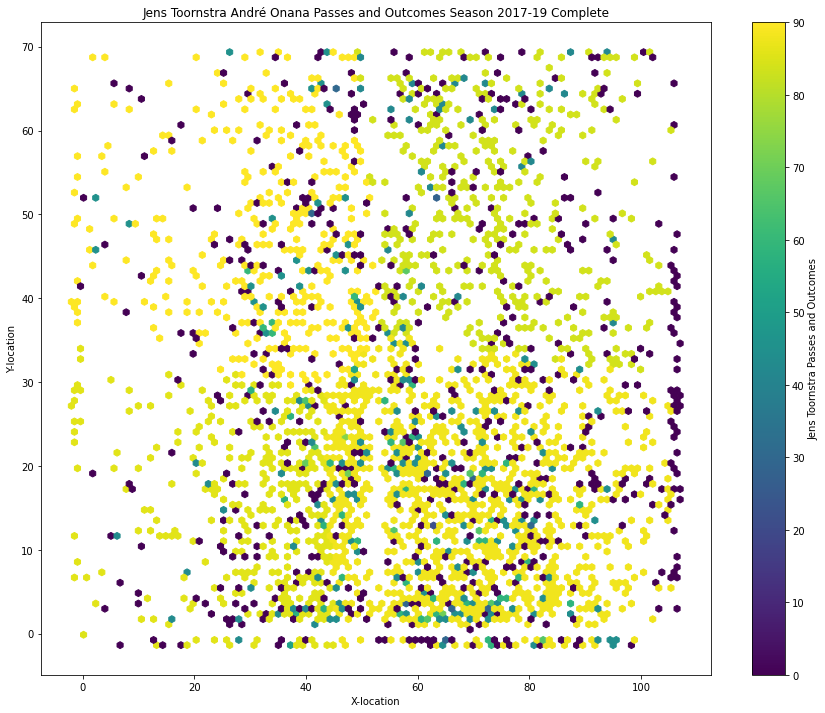

In [73]:
x = Toornstra['x']
y = Toornstra['y']
z = Toornstra['Value_Individual_Pass']

# These lines are completely unnecessary and perhaps come
# from a different solution which was interpolating between points
#X, Y = np.meshgrid(x,y)
#x = X.ravel()
#y = Y.ravel()

gridsize = 30 
#plt.subplot(111)  # <- You don't need this as it is one plot anyway
plt.hexbin(x, y, C=z)   # <- You need to do the hexbin plot
cb = plt.colorbar()
cb.set_label('Jens Toornstra Passes and Outcomes')
plt.xlabel("X-location")
plt.ylabel("Y-location")
plt.title("Jens Toornstra André Onana Passes and Outcomes Season 2017-19 Complete")
plt.gcf().set_size_inches(15, 12)
plt.show() 

In [74]:
SET=SET[SET['NUMBER OF EVENTS']>100]

In [75]:
TEAMS_RANK=pd.DataFrame(SET.groupby("Team Name")['ECOM'].mean()/90)

In [76]:
TEAMS_RANK.sort_values("ECOM",ascending=False)

,ECOM
Team Name,
AZ,0.978190
Feyenoord,0.966366
Ajax,0.943171
PSV,0.932517
FC Emmen,0.885399
ADO Den Haag,0.863955
Fortuna Sittard,0.862520
PEC Zwolle,0.852707
Willem II,0.847161
